# Classification metrics (video part 32)

### Goals:
- Accuracy
- Logarithmic loss
- Area under ROC curve
- (Quadratic weighted) kappa

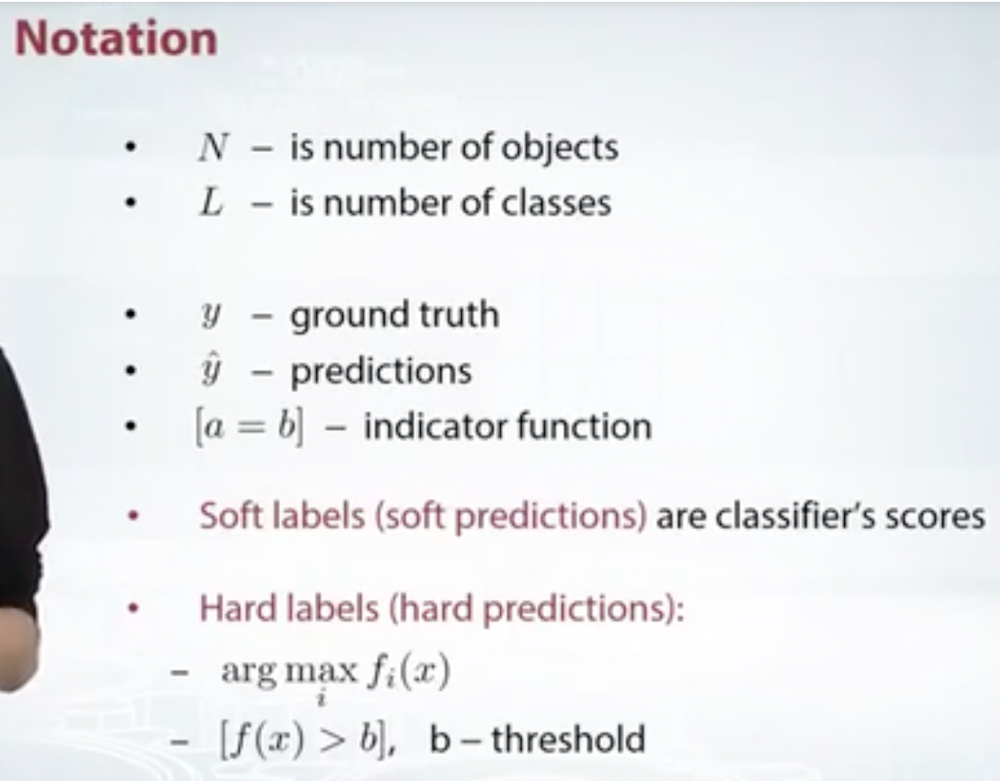
- Example for soft predictions are probabilities for
an objects to belong to each class. The scores can be written as a vector of size L.
- In classification, we are usually asked to predict a label for the object, ie do a hard prediction. TO do it, we usually find a maximum value in the soft predictions, and set class that corresponds to this maximum score as our predicted label.
- Hard label is a function of soft labels, it is usually argmax for multi class tasks, but for binary classification, it can be thought as a thresholding function. We ouput label 1 when the soft score for the class 1 is higher than the threshold, and we output class 0 otherwise.


#### Accuracy
- Measures how frequently our class prediction is correct
- Valued between 0 and 1
- The higher the better
- It is equal to the fraction of correctly classified objects
- To use accuracy, we need hard predictions ie we need to assign each object a specific label.
- Best constant: predict the most frequent class.
- Example of caveat in interepreting accuracy score:
  - Our dataset: 10 cats, 90 dogs. Even if we always predict dog, the accuracy is already 0.9!
  - So the problem: base line accuracy score can be very high for a data set and that makes it hard to interpret the result.
- Accuracy is hard to optimize. It doesn't care how confident the classificer is in the predictions and what the soft predictions are. It cares only about the argmax of the soft predictions.

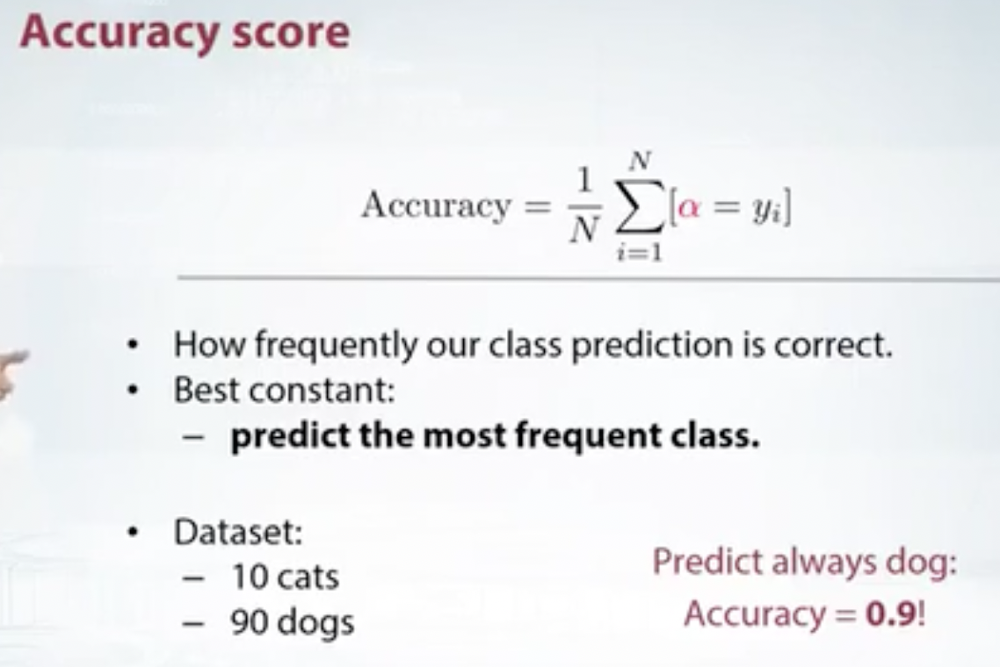

#### Logarithmic loss (logloss)
- Metric that works with soft predictions
- It tries to make the classifier to output two posterior probability for the objects to be of a certain class
- For binary, it is assumed that yhat is a number from 0-1 range, and it is the probability of an object belonging to class 1. So 1-yhat is the probability for the object to be of class 0.
- For multiclass tasks, yhat is a vector of size L, and its sum is exactly 1. The elements are the probability belonging to each of the classes.
- In order to avoid nulls in practise, predictions are clipped not from 0 to 1, but from some small positive number to (1- some small positive number).
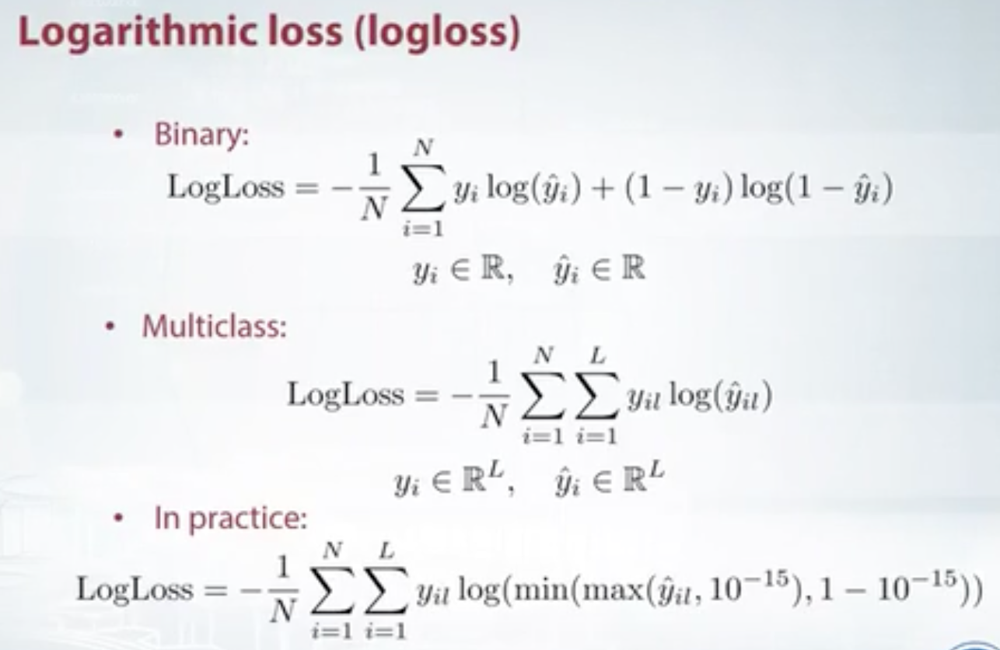
- Let's analyze: Assume a target for an object is 0 and here on the plot, we see how the error will change if we change our prediction from 0 to 1.
- We can see that logloss penalizes completely wrong answers and prefers to make a lot of small mistakes to one severe mistake. Compare this with the absolute error.
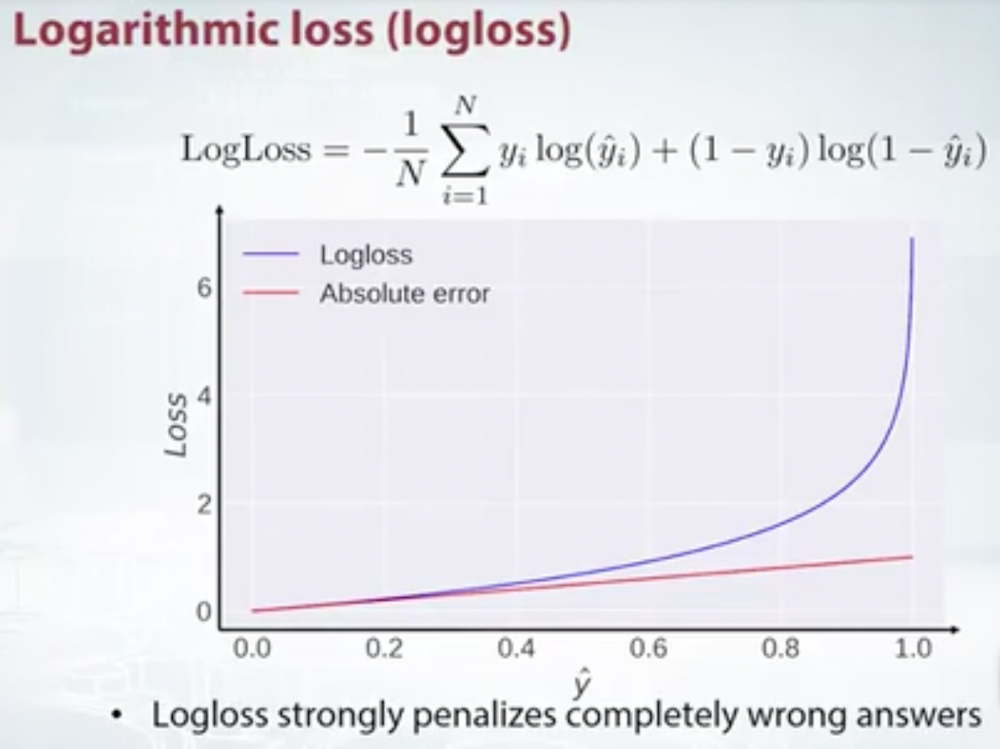
- Best constant: set predictions to the frequencies of each class in the data set. For example if our dataset has 10 cats, 90 dogs, then the best constant prediction would be the vector of [0.1,0.9].
- To prove the above, we should take a derivate with the respect to constant alpha, set it to 0 and find alpha from this equation.
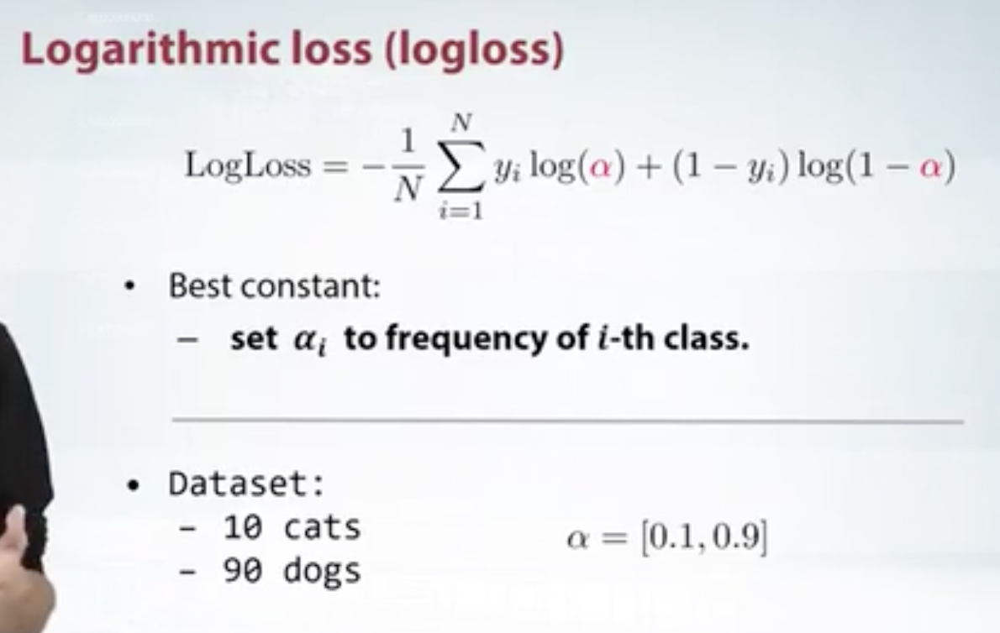


#### Area under curve (AUC ROC)
- This metrics try all possible threshold and aggregates those scores.
- This metric doesn't really cares about absolute values of the predictions but it depends on the order of the objects.
- Several explainations:
  - Area under curve: explains under what curve we should compute area
  - explains AUC as the probability of object pairs to be correctly ordered by our model.
  - both explaination above gave the same score.
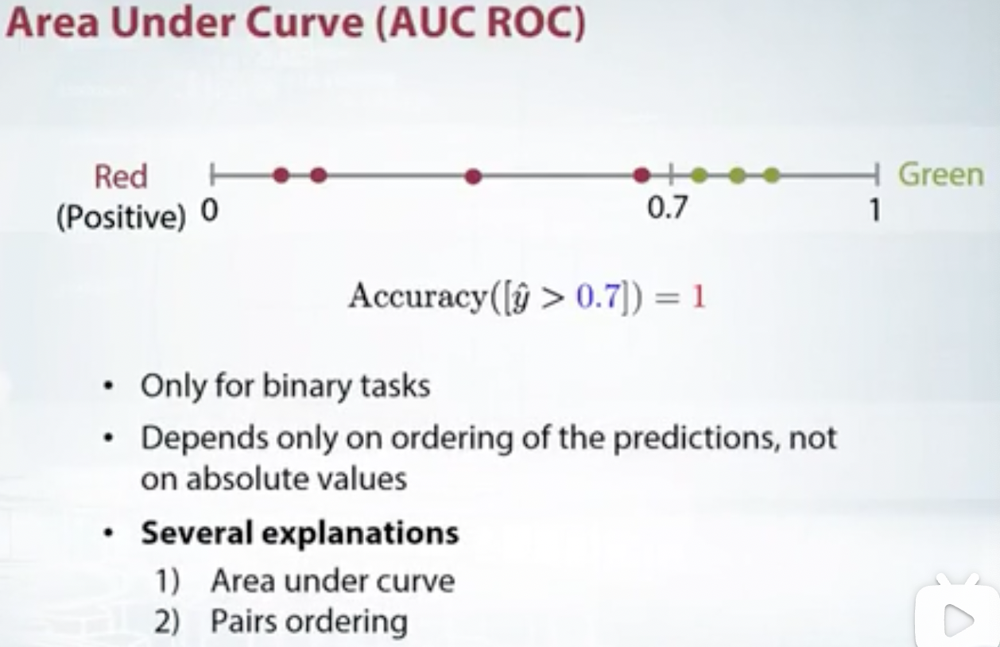
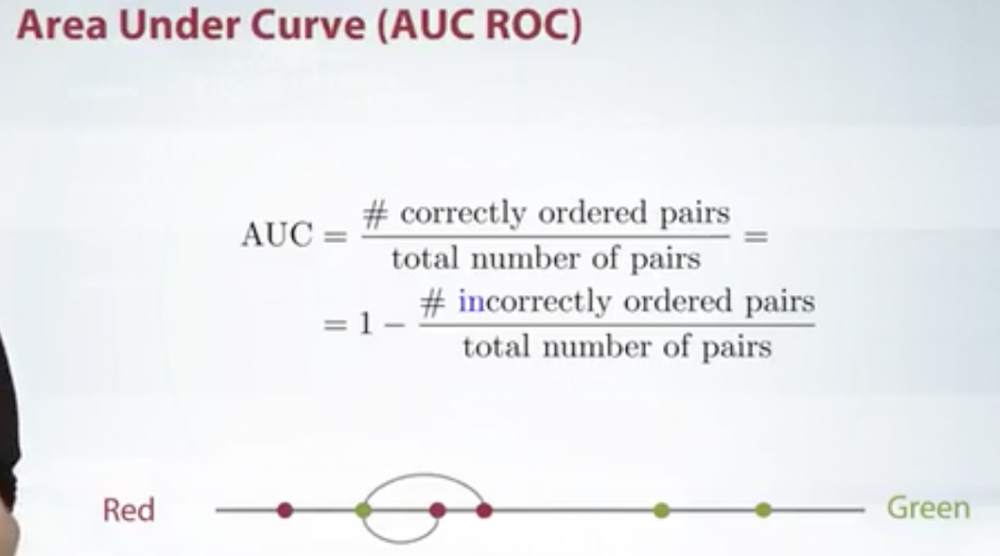
- Best constant: all constants give the same score
- Random predictions lead to AUC = 0.5

#### Cohen's kappa motivation
- Recall that if we always predict the label of the most frequent class, we can already get pretty high accuracy score, and that can be misleading.
- Actually in our examples, all fitted models will have a score somewhere between 0.9 and 1.0.
- So we can introduce a new metric such thtat for an accuracy of 1, it would give us 1 and for the baseline accuracy it would output 0.
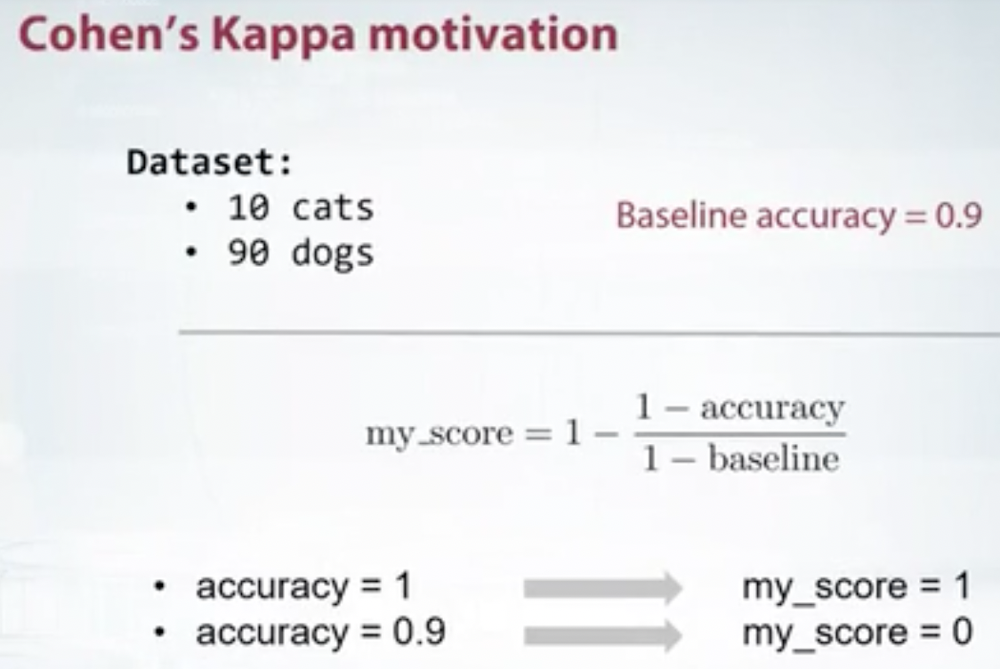
- In Cohen's Kappa, we take the higher predictions for the data set and shuffle them (randomly permute). Then we calculate an accuracy for these shuffled predictions. We do this many times and the average of this is our baseline.
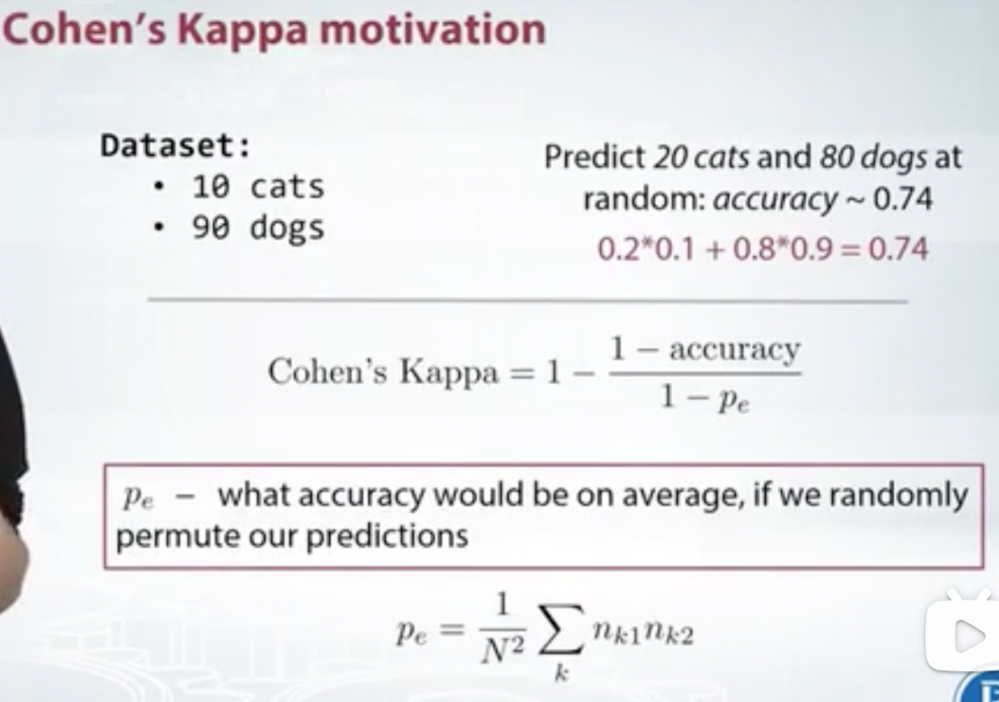
- This baseline can be computed analytically. We need first to multiply the empirical frequncies of our predictions and grant those lables for each class then sum them up.
- For exmaple, if we assign 20 cat labels and 80 dogs labels at random, then the baseline accuracy would be `0.2*0.1 + 0.8*0.9 = 0.74`
- Error = 1 - accuracy. We could also rewrite the formula as `1 - model error/baseline error`
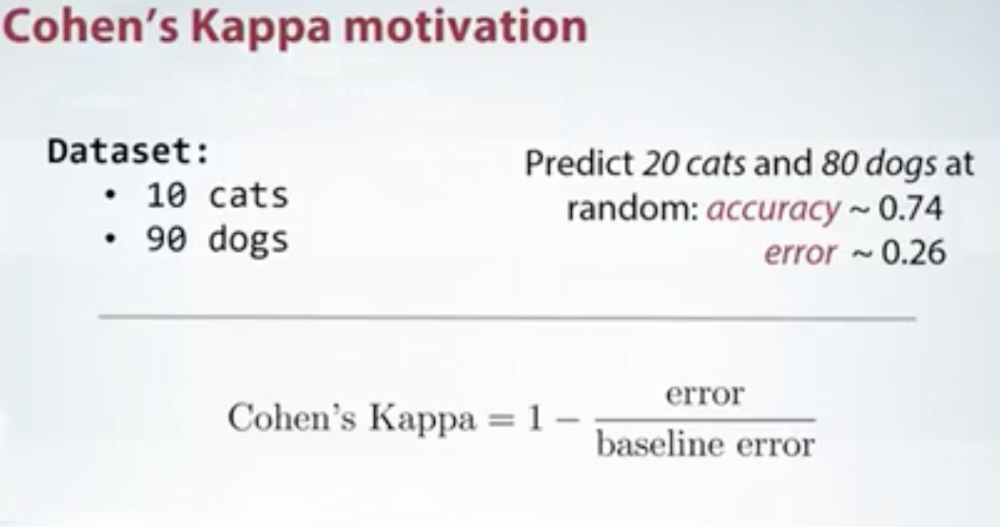
- This formula is still Cohen's Kappa, but now it would be easier to derive weighted Cohen's Kappa.
- To explain weighted Kappa, we need to introduce weighted error first:
  - Imagine now the dataset contains cats, dogs and tigers. And we are okay if we misclassify dog/cat as each other, but not okay to classify cat/dog as tiger.
  - We first can do a weight matrix where each cell contains the weight for the mistakes we might do. In our case, we set error weight to be 10 times larger if we predict cat or dog but the ground truth is tiger.
  - With this error weight matrix, we can express our preferences on the error that the classifer would make.
  - To calculate weighted error, we also need the confusion matrix for our model's prediction.
  - To calculate a weighted error score, we need to multiply these two matrices element-wise and sum their results.
  - The weighted error needs a proper normalization to make sure the quantity is between 0 and 1.
  - Finally, the weighted kappa is calculated as `1-weighted kappa / weighted baseline error`
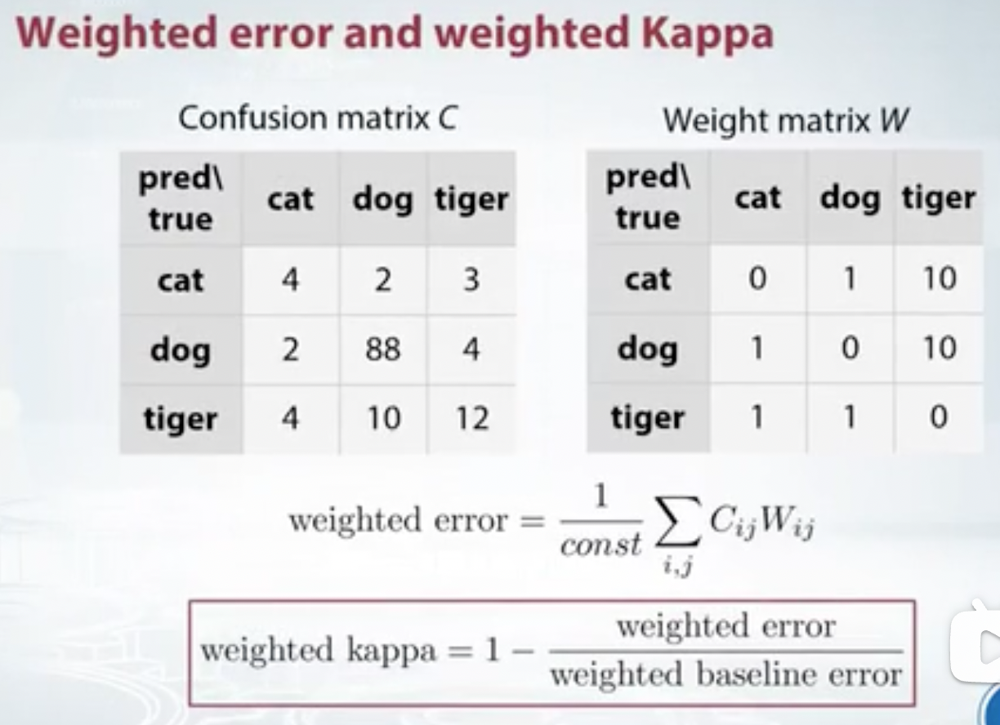
- Example: classification problem with ordered labels
  - Say we need to assign each object a value from 1 to 3. Eg it could be a rating of how severe a disease is.
  - This is not regression, since you do not allow the output values to be somewhere between the ratings and the ground truth values look more like labels.
  - In such cases, we treat them as classifcation problems but the weight matrix is introduced to account for the order of the labels.
  - For example, weights can be linear, if we predict 2 instead of 1, we pay a loss of 1. If we predict 2 instead of 1, we also pay a loss of 1. If we predict 3 instead of 1, we pay loss of 2.
  - The weights can also be quadratic, if we predict 2 instead of 1, we pay loss of 1 but if we predict 3 instead of 1, we pay loss of 4.
  - Depending on the weight matrix is used, we either get linear weighted kappa or quadratic weighted kappa.
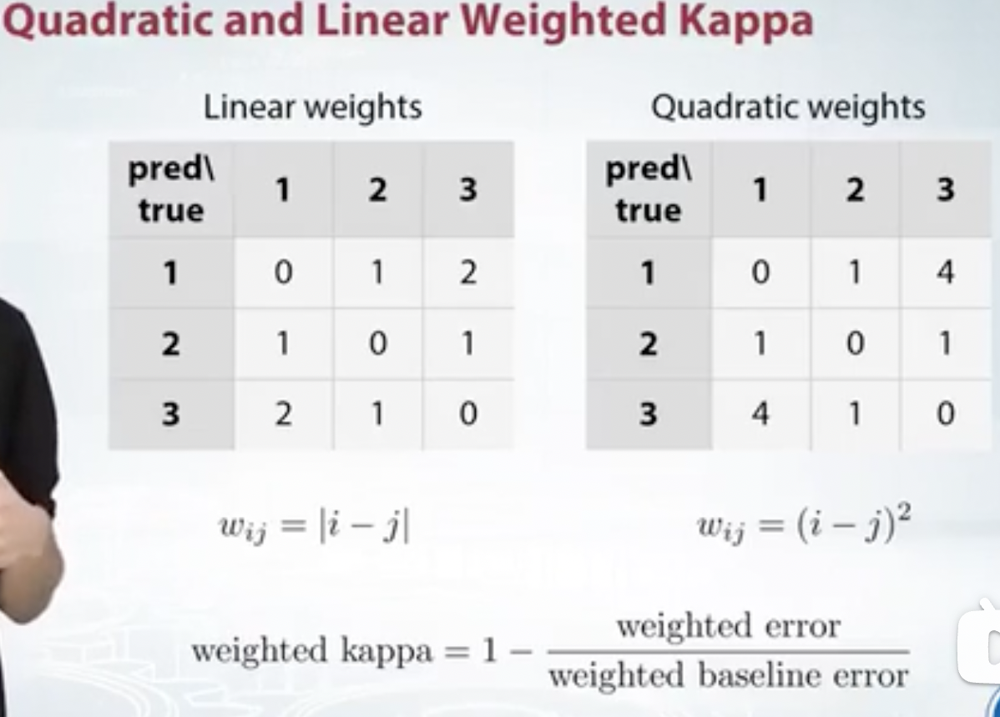
- Quadratic weighted kappa has been used in several competitions. It is usually explained as inter-rated agreement coefficient - how much the predictions of the model agree with the ground-truth raters.


#### Conclusion:
- Accuracy is a simple metrics for classification, but a simple model that alwaus predict the same value can possibly have a very high accuracy that makes it hard to interprete this metric. The score also depends on the threshold we choose to convert soft predictions to hard labels.
- Logloss depends on soft predictions rather than on hard labels. It forces the model to predict probabilities of an object to belong to each class.
- AUC, area under receiver operating curve doesn't depend on absolute values predicted by classifier but only considers the ordering of the object. It also implicitly tries all thresholds to converge soft predictions to hard labels, thus removes the dependence of the score on the threshold
- Cohen's Kappa fixes the baseline for accuracy score to be zero. If instead of accuracy, we used weighted accuracy, we would get weighted kappa. Weighted kappa with quadratic weights is called quadratic weighted kappa.

# What I learnt:
- Difference between soft predictions and hard predictions. Soft predictions is the probability the model gave, hard predictions is the hardcoded category label we get by doing thresholding on the soft predictions (eg x>0.5 == ypred 1)
- Logloss penalizes completely wrong answers and prefers to make a lot of small mistakes to one severe mistake (see logloss plot). Compare this with the absolute error which has only linear loss.
- We can assign specific weight to wrong prediction using Cohen's weighted Kappa.
- There are 2 kinds of Cohen's weighted Kappa: linear and quadratic.
- Cohen's quadratic weighted Kappa is usually used as inter-rated agreement coefficient - eg how much the predictions of the model agree with the ground truth raters.